In [17]:
import itertools
import os
import pathlib
import string
import tempfile
import time

import ffmpeg
import h5py
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy as sp
import scipy.special
from sklearn import decomposition
from sklearn import manifold
import pickle

import sys
sys.path.insert(0, '/jukebox/hasson/snastase/social-ctf')
from ctf_dataset import load
from ctf_dataset import info
from ctf_dataset.info import constants
from ctf_dataset.info import events
from ctf_dataset.load import virtual
from ctf_dataset.load import utils as load_utils

In [183]:
def filter_cofluc(select_cfs, matchup_id=0,repeat_id=np.arange(8),pair_id = slice(None),time=slice(None, None, 500),melt = True,coop = True):
    repeat_cfs = []
    for repeat in repeat_id:
        cf_structure = np.load(f"results/iscf_lstm_tanh-z_pca-k100_m{matchup_id}_r{repeat}.npy")
        print(f"loaded in cfs for repeat{repeat}")
        pair_cfs = cf_structure[pair_id,...]
        cfs = pair_cfs[...,select_cfs,select_cfs]          
        if coop:
            cfs = np.repeat(cfs,2,axis = 0)
        
        repeat_cfs.append(cfs)
        
    repeat_cfs = np.stack(repeat_cfs)
    if melt:
        repeat_cfs = np.reshape(repeat_cfs, (-1,len(select_cfs)))
    return repeat_cfs

map_id=0
matchup_id=0
repeat_id = 0
pair_id = [0,5]
time=slice(None)
select_cfs = [2,7,10]

cofluctuation = np.load(f"results/iscf_lstm_tanh-z_pca-k100_m{matchup_id}_r{repeat_id}.npy")
print(cofluctuation.shape)

test = filter_cofluc(select_cfs,pair_id=pair_id,time=time)
print(test.shape)

(6, 4501, 100, 100)
loaded in cfs for repeat0
loaded in cfs for repeat1
loaded in cfs for repeat2
loaded in cfs for repeat3
loaded in cfs for repeat4
loaded in cfs for repeat5
loaded in cfs for repeat6
loaded in cfs for repeat7
(144032, 3)


In [116]:
def filter_pcs(pca_structure,select_pcs,map_id=slice(None), matchup_id=slice(None), repeat_id=slice(None),
        player_id=slice(None), time=slice(None, None, 500),melt = True):
        pcs = np.squeeze(pca_structure[map_id, matchup_id, repeat_id, player_id,time,select_pcs])
        
        if melt:
            if len(select_pcs) > 1:
                pcs = np.reshape(np.moveaxis(pcs,0,-1),(-1,len(select_pcs)))                 
        return pcs

filter_kwargs_tsne = dict(
    map_id=slice(None),
    matchup_id=0,
    repeat_id=slice(None),
    player_id=slice(None),
    time=slice(None),
    melt = True
)

In [30]:
if os.path.exists('results/filtered_pcs_tsne.pkl'):
    with open('results/filtered_pcs_tsne.pkl', 'rb') as f:
        filtered_pcs_tsne = pickle.load(f)
else:
    lstms_pca = np.load("results/lstms_tanh-z_pca-k100.npy")
    lstms_pca_maps = lstms_pca[np.newaxis, ...]
    
    def filter_pcs(pca_structure,select_pcs,map_id=slice(None), matchup_id=slice(None), repeat_id=slice(None),
        player_id=slice(None), time=slice(None, None, 500),melt = True):
        pcs = np.squeeze(pca_structure[map_id, matchup_id, repeat_id, player_id,time,select_pcs])
        
        if melt:
            if len(select_pcs) > 1:
                pcs = np.reshape(np.moveaxis(pcs,0,-1),(-1,len(select_pcs)))                 
        return pcs

    filter_kwargs_tsne = dict(
        map_id=slice(None),
        matchup_id=0,
        repeat_id=slice(None),
        player_id=slice(None),
        time=slice(None),
        melt = True
    )
    filtered_pcs = filter_pcs(lstms_pca_maps,**filter_kwargs_tsne)
    
    def get_tsne_embedding(filtered_pcs, n_components=2, random_state=0):
        embedding = manifold.TSNE(n_components, random_state=random_state)
        filtered_pcs_tsne = embedding.fit_transform(filtered_pcs)
        return filtered_pcs_tsne

    filtered_pcs_tsne = get_tsne_embedding(filtered_pcs, n_components=2)
    print(filtered_pcs_tsne.shape)
    
    with open('results/filtered_pcs_tsne.pkl','wb') as f: 
        pickle.dump(filtered_pcs_tsne, f)

filter_kwargs = dict(
    map_id=slice(None),
    matchup_id=0,
    repeat_id=slice(None),
    player_id=slice(None),
    time=slice(None),
    melt = True
)

(144032, 2)


In [ ]:
filter_kwargs = dict(
    map_id=slice(None),
    matchup_id=0,
    repeat_id=slice(None),
    player_id=slice(None),
    time=slice(None),
    melt = True
)

### Here we load the lstm shape.
The shape should be (1, 4, 8, 4, 4501, 100)

In [ ]:
lstms_pca = np.load("results/lstms_tanh-z_pca-k100.npy")

In [ ]:
lstms_pca.shape # matchup, 8 repeats, 4 players, tp, pca
# matchup = 0, 3; # all 8, all 4 players, tp slice by 500, : 

# use this for when we have multiple maps
lstms_pca_maps = lstms_pca[np.newaxis, ...]

In [31]:
lstms_pca_maps.shape

(1, 4, 8, 4, 4501, 100)

In [209]:
# note kwargs use and time factor 180
filter_kwargs_tsne = dict(
    map_id=slice(None),
    matchup_id=0,
    repeat_id=slice(None),
    player_id=slice(None),
    time=slice(None),
    select_pcs = [7],
    melt = True
)
filtered_pcs = filter_pcs(lstms_pca_maps,**filter_kwargs_tsne)
filtered_pcs.shape

In [210]:
def get_tsne_embedding(filtered_pcs, n_components=2, random_state=0):
    embedding = manifold.TSNE(n_components, random_state=random_state)
    filtered_pcs_tsne = embedding.fit_transform(filtered_pcs)
    return filtered_pcs_tsne

filtered_pcs_tsne = get_tsne_embedding(filtered_pcs, n_components=2)
print(filtered_pcs_tsne.shape)

(144032, 2)


loaded in cfs for repeat0
loaded in cfs for repeat1
loaded in cfs for repeat2
loaded in cfs for repeat3
loaded in cfs for repeat4
loaded in cfs for repeat5
loaded in cfs for repeat6
loaded in cfs for repeat7


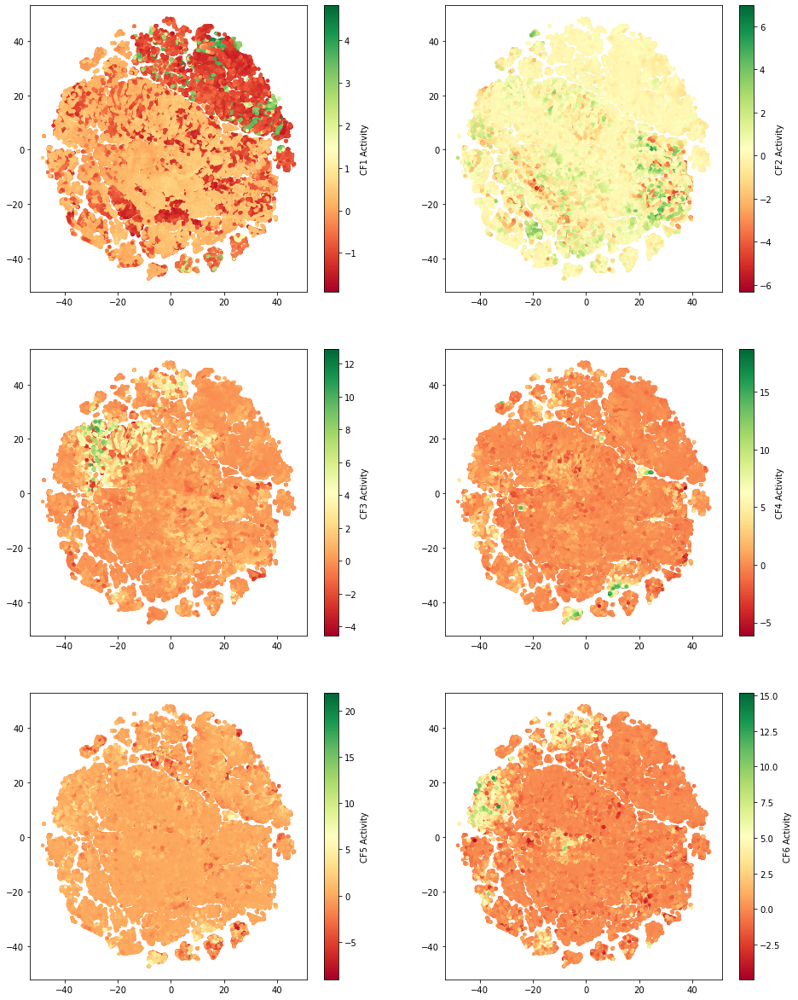

In [185]:
def plot_specific_cf(which_cfs,embedding):
    actual_cfs = filter_cofluc(select_cfs,pair_id=pair_id,time=time)
    
    ncols = 2
    nrows = int(np.ceil(len(which_cfs)/2))
    fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8 * ncols, 7 * nrows), squeeze=False)
    
    cmap = plt.cm.get_cmap("RdYlGn")
    count = 0
    # Tag.
    for r in range(nrows):
        for c in range(ncols):
            if count == len(which_cfs):
                break
            else:
                color = actual_cfs[:,count]
                

                # lim = np.max(np.abs(color))
                sc = axes[r,c].scatter(embedding[:, 0], embedding[:, 1], c=color,s=10, cmap=cmap) #, vmin=-lim, vmax=lim
                cb = fig.colorbar(sc,ax=axes[r,c])

                cb.set_label(f"CF{which_cfs[count]+1} Activity")
                count += 1
            

pair_id = [0,5]
select_cfs = [0,1,2,3,4,5]
time = slice(None)
plot_specific_cf(select_cfs,filtered_pcs_tsne)

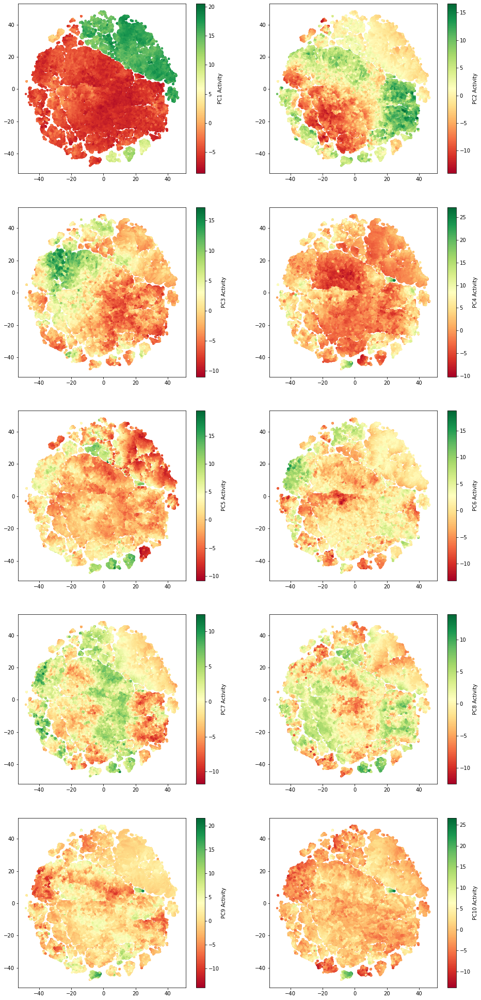

In [123]:
def plot_specific_pc(which_pcs,embedding):
    actual_pcs = filter_pcs(lstms_pca_maps,which_pcs,**filter_kwargs_tsne)
    
    ncols = 2
    nrows = int(np.ceil(len(which_pcs)/2))
    fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8 * ncols, 7 * nrows), squeeze=False)
    
    cmap = plt.cm.get_cmap("RdYlGn")
    count = 0
    # Tag.
    for r in range(nrows):
        for c in range(ncols):
            if count == len(which_pcs):
                break
            else:
                color = actual_pcs[:,count]
                

                # lim = np.max(np.abs(color))
                sc = axes[r,c].scatter(embedding[:, 0], embedding[:, 1], c=color,s=10, cmap=cmap) #, vmin=-lim, vmax=lim
                cb = fig.colorbar(sc,ax=axes[r,c])

                cb.set_label(f"PC{which_pcs[count]+1} Activity")
                count += 1
            

plot_specific_pc(np.arange(10),filtered_pcs_tsne)

In [153]:
def filter_dataset(
    wrap_file, value_name,
    map_id=slice(None), matchup_id=slice(None), repeat_id=slice(None),
    player_id=slice(None), time=slice(None, None, 500),melt=True):
    """Slices and filters data."""
    # Good time factors are:
    # 2250, 1500, 1125, 900, 750, 500, 450, 375, 300, 250, 225, 180, 150, 125, 100.
    # These will always include the first and last lstm state. 

    # ** why is time factor default 500 here here?

    # Slice the data.
    value = wrap_file["map/matchup/repeat/player/time/{}".format(value_name)][map_id, matchup_id, repeat_id, player_id, time, ...]

    # Filter on agent id.
    value_shape = (value.shape[-1],)

    # Convert last.
    value = value.astype(np.float32)
    
    if melt:
        value = np.reshape(value, (-1,) + value_shape)

    return value

filtered_ts = filter_dataset(wrap_file, value_name="action", **filter_kwargs)
print(filtered_ts.shape)

(144032, 6)


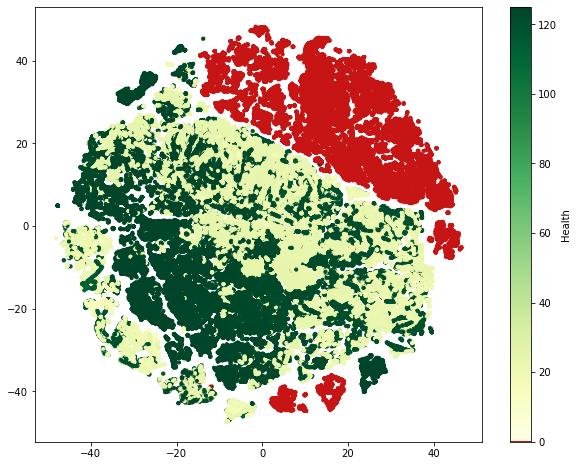

In [157]:
def plot_embedding_health(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="health", **filter_kwargs)
    color *= 200
    fig, axes = plt.subplots(1, 1, figsize=(10, 8))

    # Custom colormap.
    cmap = plt.cm.get_cmap("YlGn")

    newcolors = cmap(np.linspace(0, 1, 256))
    pink = np.array([200/256, 20/256, 20/256, 1])
    newcolors[:1, :] = pink
    newcmp = matplotlib.colors.ListedColormap(newcolors)

    sc = axes.scatter(embedding[:, 0], embedding[:, 1], c=color[:,0], s=10, cmap=newcmp)
    cb = fig.colorbar(sc)

    cb.set_label("Health")

plot_embedding_health(wrap_file, filtered_pcs_tsne, filter_kwargs)

In [14]:
# Data directory.
DATA_DIR = "/jukebox/hasson/snastase/social-ctf/data" 

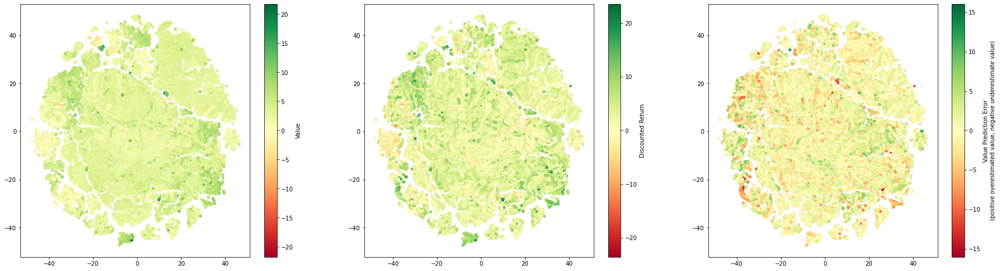

In [159]:
def plot_embedding_value(wrap_file, embedding, filter_kwargs):
    value = filter_dataset(wrap_file, value_name="value", **filter_kwargs)
    discounted_return = filter_dataset(wrap_file, value_name="discounted_return", **filter_kwargs)
    diff = value - discounted_return
    fig, axes = plt.subplots(1, 3, figsize=(30, 8))

    cmap = plt.cm.get_cmap("RdYlGn")

    lim = np.max(np.abs(value))
    sc = axes[0].scatter(embedding[:, 0], embedding[:, 1], c=value[:,0], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[0])
    cb.set_label("Value")

    lim = np.max(np.abs(discounted_return))
    sc = axes[1].scatter(embedding[:, 0], embedding[:, 1], c=discounted_return[:,0], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[1])
    cb.set_label("Discounted Return")

    lim = np.max(np.abs(diff))
    sc = axes[2].scatter(embedding[:, 0], embedding[:, 1], c=diff[:,0], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[2])
    cb.set_label("Value Prediction Error\n(positive overestimated value, negative underestimate value)")

plot_embedding_value(wrap_file, filtered_pcs_tsne, filter_kwargs)

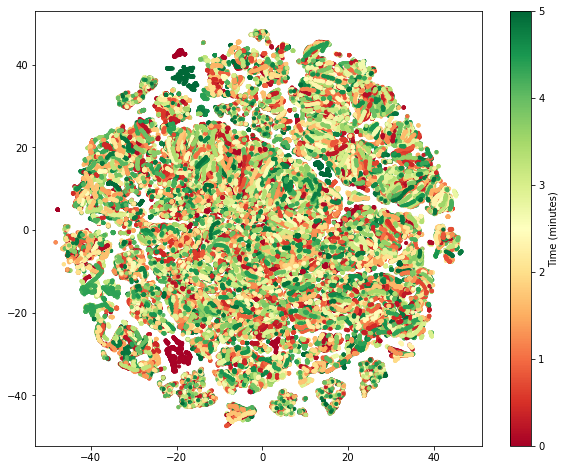

In [160]:
def plot_embedding_time(wrap_file, embedding, filter_kwargs):
    time_slice = filter_kwargs["time"]
    start, stop, step = time_slice.start, time_slice.stop, time_slice.step
    start = start or 0
    stop = stop or 4501
    step = step or 1
    color = np.zeros([embedding.shape[0], 1])
    i = 0
    while i < embedding.shape[0]:
    for t in range(start, stop, step):
      color[i] = t 
      i += 1

    fig, axes = plt.subplots(1, 1, figsize=(10, 8))
    cmap = plt.cm.get_cmap("RdYlGn")
    lim = np.max(np.abs(color))
    sc = axes.scatter(embedding[:, 0], embedding[:, 1], c=color[:,0], cmap=cmap, s=10, vmin=0, vmax=lim)
    cb = fig.colorbar(sc)

    cb.set_ticks([i*15*60 for i in range(6)])
    cb.set_ticklabels(["0", "1", "2", "3", "4", "5"])
    cb.set_label("Time (minutes)")

plot_embedding_time(wrap_file, filtered_pcs_tsne, filter_kwargs)

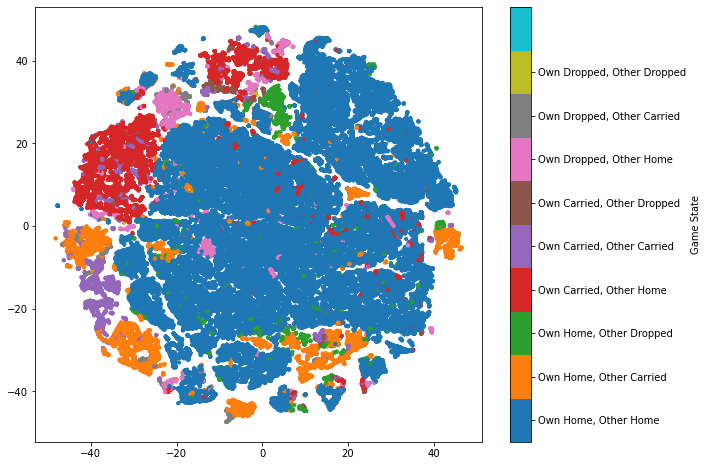

In [184]:
def plot_embedding_own_game_status(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="own_game_status", **filter_kwargs)

    fig, axes = plt.subplots(1, 1, figsize=(10, 8))
    cmap = plt.cm.get_cmap("tab10")

    sc = axes.scatter(embedding[:, 0], embedding[:, 1], c=color[:,0], cmap=cmap, s=10, vmin=-0.5, vmax=9.5)
    cb = fig.colorbar(sc)

    cb.set_ticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
    cb.set_ticklabels([
      "Own Home, Other Home",
      "Own Home, Other Carried",
      "Own Home, Other Dropped",
      "Own Carried, Other Home",
      "Own Carried, Other Carried",
      "Own Carried, Other Dropped",
      "Own Dropped, Other Home",
      "Own Dropped, Other Carried",
      "Own Dropped, Other Dropped",
    ])
    cb.set_label("Game State")

plot_embedding_own_game_status(wrap_file, filtered_pcs_tsne, filter_kwargs)

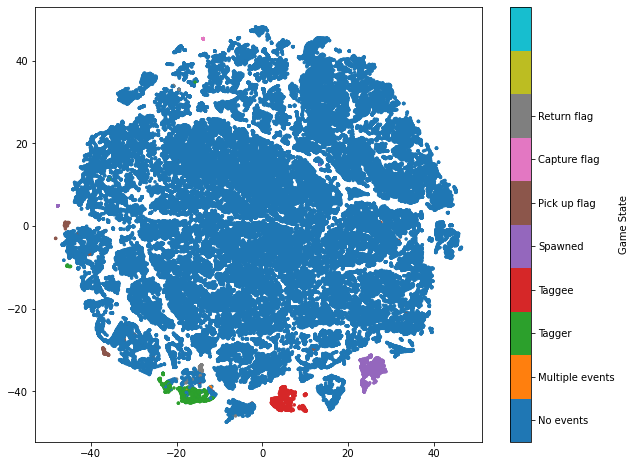

In [186]:
def plot_embedding_event(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="events", **filter_kwargs)

    tag_ind = info.events.Events.TAG_PLAYER_PLAYER
    tagged_ind = info.events.Events.TAG_PLAYER_OTHER_PLAYER
    spawn_ind = info.events.Events.SPAWN_PLAYER_PLAYER
    pick_ind = info.events.Events.CTF_FLAG_BONUS_PLAYER
    capture_ind = info.events.Events.CTF_CAPTURE_BONUS_PLAYER
    return_ind = info.events.Events.CTF_RECOVERY_BONUS_PLAYER
    win_ind = info.events.Events.PLAYER_WIN_PLAYER
    loss_ind = info.events.Events.PLAYER_LOSS_PLAYER
    draw_ind = info.events.Events.PLAYER_DRAW_PLAYER

    event = color[:, (tag_ind, tagged_ind, spawn_ind, pick_ind, capture_ind, return_ind)] > 0
    num_events = np.sum(event, axis=1)
    color = np.where(num_events == 0, 0, np.where(num_events > 1, 1, np.argmax(event, axis=1) + 2))
    color = np.expand_dims(color, axis=-1)

    fig, axes = plt.subplots(1, 1, figsize=(10, 8))
    cmap = plt.cm.get_cmap("tab10")

    sc = axes.scatter(embedding[:, 0], embedding[:, 1], c=color[:,0], cmap=cmap, s=6, vmin=-0.5, vmax=9.5)
    cb = fig.colorbar(sc)

    cb.set_ticks([0, 1, 2, 3, 4, 5, 6, 7])
    cb.set_ticklabels([
      "No events",
      "Multiple events",
      "Tagger",
      "Taggee",
      "Spawned",
      "Pick up flag",
      "Capture flag",
      "Return flag",
    ])
    cb.set_label("Game State")

plot_embedding_event(wrap_file, filtered_pcs_tsne, filter_kwargs)

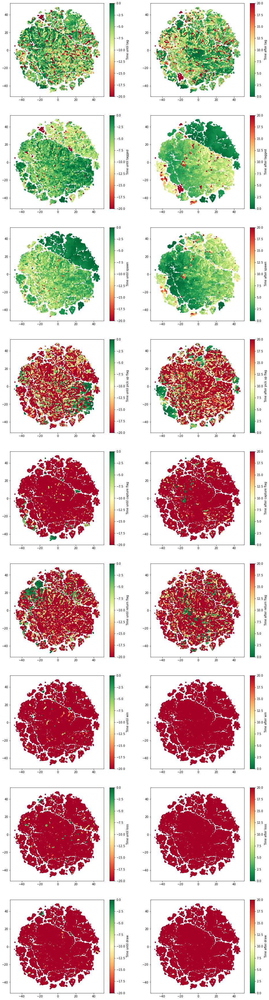

In [165]:
def plot_embedding_event_time(wrap_file, embedding, filter_kwargs):
    time_until = filter_dataset(wrap_file, value_name="time_steps_until_events", **filter_kwargs)
    time_after = filter_dataset(wrap_file, value_name="time_steps_after_events", **filter_kwargs)
    # print(color)

    lim = 20  # Seconds before

    time_until /= 15
    time_until = np.where(np.isnan(time_until), lim, time_until)
    time_until *= - 1

    time_after /= 15
    time_after = np.where(np.isnan(time_after), lim, time_after)


    tag_ind = info.events.Events.TAG_PLAYER_PLAYER
    tagged_ind = info.events.Events.TAG_PLAYER_OTHER_PLAYER
    spawn_ind = info.events.Events.SPAWN_PLAYER_PLAYER
    pick_ind = info.events.Events.CTF_FLAG_BONUS_PLAYER
    capture_ind = info.events.Events.CTF_CAPTURE_BONUS_PLAYER
    return_ind = info.events.Events.CTF_RECOVERY_BONUS_PLAYER
    win_ind = info.events.Events.PLAYER_WIN_PLAYER
    loss_ind = info.events.Events.PLAYER_LOSS_PLAYER
    draw_ind = info.events.Events.PLAYER_DRAW_PLAYER

    inds = [
      tag_ind,
      tagged_ind,
      spawn_ind,
      pick_ind,
      capture_ind,
      return_ind,
      win_ind,
      loss_ind,
      draw_ind,
    ]

    labels = [
      "tag",
      "tagged",
      "spawn",
      "pick up flag",
      "capture flag",
      "return flag",
      "win",
      "loss",
      "draw",
    ]

  # event = color[:, (tag_ind, tagged_ind, spawn_ind, pick_ind, capture_ind, return_ind)] > 0
  # num_events = np.sum(event, axis=1)
  # color = np.where(num_events == 0, 0, np.where(num_events > 1, 1, np.argmax(event, axis=1) + 2))
  # color = np.expand_dims(color, axis=-1)

    ncols = 2
    nrows = 9
    fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8 * ncols, 7 * nrows), squeeze=False)

    cmap = plt.cm.get_cmap("RdYlGn")
    cmap_r = plt.cm.get_cmap("RdYlGn_r")

    # Tag.
    for r, (ind, label) in enumerate(zip(inds, labels)):
        sc =  axes[r, 0].scatter(embedding[:, 0], embedding[:, 1], c=time_until[:, ind], cmap=cmap, s=6, vmin=-lim, vmax=0)
        cb = fig.colorbar(sc, ax=axes[r, 0])
        cb.set_label("Time until {}".format(label))

        sc = axes[r, 1].scatter(embedding[:, 0], embedding[:, 1], c=time_after[:, ind], cmap=cmap_r, s=6, vmin=0, vmax=lim)
        cb = fig.colorbar(sc, ax=axes[r, 1])
        cb.set_label("Time after {}".format(label))

plot_embedding_event_time(wrap_file, filtered_pcs_tsne, filter_kwargs)

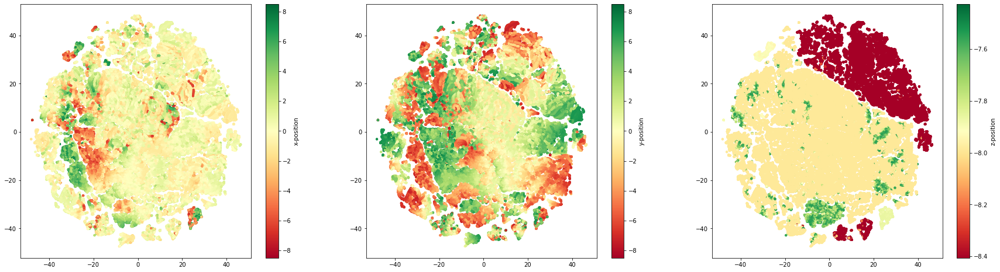

In [169]:
def plot_embedding_position(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="position", **filter_kwargs)
    fig, axes = plt.subplots(1, 3, figsize=(30, 8))
    cmap = plt.cm.get_cmap("RdYlGn")
    lim = 8.5

    sc = axes[0].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 0], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[0])
    cb.set_label("x-position")

    sc = axes[1].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 1], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[1])
    cb.set_label("y-position")

    sc = axes[2].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 2], cmap=cmap, s=10)
    cb = fig.colorbar(sc, ax=axes[2])
    cb.set_label("z-position")

plot_embedding_position(wrap_file, filtered_pcs_tsne, filter_kwargs)

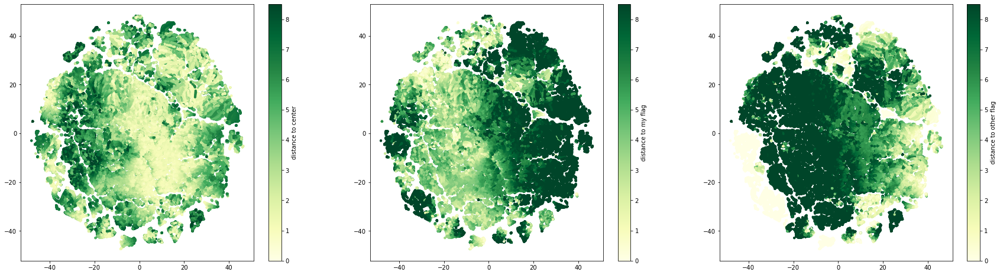

In [170]:
def plot_embedding_distance(wrap_file, embedding, filter_kwargs):
    pos = filter_dataset(wrap_file, value_name="position", **filter_kwargs)
    own_flag_pos = filter_dataset(wrap_file, value_name="own_flag_position", **filter_kwargs)
    opponent_flag_pos = filter_dataset(wrap_file, value_name="opponent_flag_position", **filter_kwargs)

    center_dist = np.sqrt(np.sum(np.square(pos[:, :2]), axis=1))
    own_flag_dist = np.sqrt(np.sum(np.square(pos[:, :2] - own_flag_pos[:, :2]), axis=1))
    opponent_flag_dist = np.sqrt(np.sum(np.square(pos[:, :2] - opponent_flag_pos[:, :2]), axis=1))

    fig, axes = plt.subplots(1, 3, figsize=(30, 8))
    cmap = plt.cm.get_cmap("YlGn")
    lim = 8.5

    sc = axes[0].scatter(embedding[:, 0], embedding[:, 1], c=center_dist, cmap=cmap, s=10, vmin=0, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[0])
    cb.set_label("distance to center")

    sc = axes[1].scatter(embedding[:, 0], embedding[:, 1], c=own_flag_dist, cmap=cmap, s=10, vmin=0, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[1])
    cb.set_label("distance to my flag")

    sc = axes[2].scatter(embedding[:, 0], embedding[:, 1], c=opponent_flag_dist, cmap=cmap, s=10, vmin=0, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[2])
    cb.set_label("distance to other flag")

plot_embedding_distance(wrap_file, filtered_pcs_tsne, filter_kwargs)

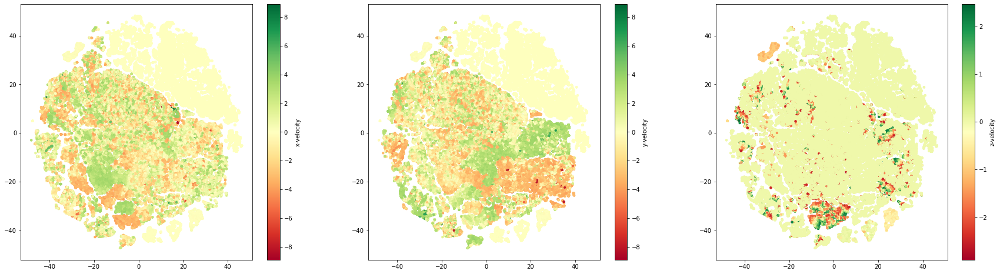

In [171]:
def plot_embedding_velocity(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="velocity", **filter_kwargs)
    fig, axes = plt.subplots(1, 3, figsize=(30, 8))
    cmap = plt.cm.get_cmap("RdYlGn")
    lim = np.max(np.abs(color))

    sc = axes[0].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 0], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[0])
    cb.set_label("x-velocity")

    sc = axes[1].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 1], cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[1])
    cb.set_label("y-velocity")

    sc = axes[2].scatter(embedding[:, 0], embedding[:, 1], c=color[:, 2], cmap=cmap, s=10)
    cb = fig.colorbar(sc, ax=axes[2])
    cb.set_label("z-velocity")

plot_embedding_velocity(wrap_file, filtered_pcs_tsne, filter_kwargs)

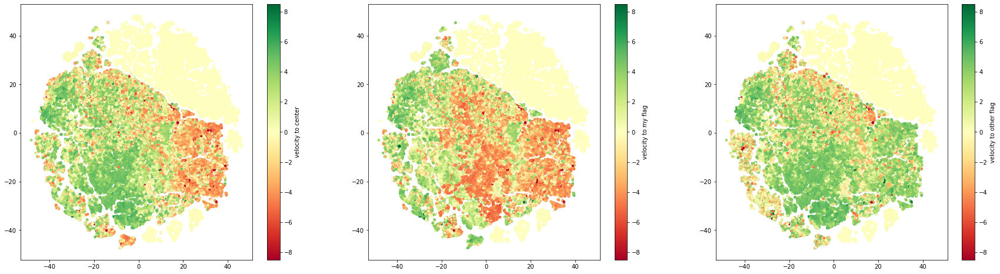

In [172]:
def plot_embedding_vels(wrap_file, embedding, filter_kwargs):
    vel = filter_dataset(wrap_file, value_name="velocity", **filter_kwargs)
    pos = filter_dataset(wrap_file, value_name="position", **filter_kwargs)
    own_flag_pos = filter_dataset(wrap_file, value_name="own_flag_position", **filter_kwargs)
    opponent_flag_pos = filter_dataset(wrap_file, value_name="opponent_flag_position", **filter_kwargs)

    center_rel = 0 - pos[:, :2]
    center_unit = center_rel/np.sum(center_rel)
    center_vel = np.sum(np.sign(center_unit) * vel[:, :2], axis=1)

    own_flag_rel = own_flag_pos[:, :2] - pos[:, :2]
    own_flag_unit = own_flag_rel/np.sum(own_flag_rel)
    own_flag_vel = np.sum(np.sign(own_flag_unit) * vel[:, :2], axis=1)

    opponent_flag_rel = opponent_flag_pos[:, :2] - pos[:, :2]
    opponent_flag_unit = opponent_flag_rel/np.sum(opponent_flag_rel)
    opponent_flag_vel = np.sum(np.sign(opponent_flag_unit) * vel[:, :2], axis=1)

    fig, axes = plt.subplots(1, 3, figsize=(30, 8))
    cmap = plt.cm.get_cmap("RdYlGn")
    lim = 8.5

    sc = axes[0].scatter(embedding[:, 0], embedding[:, 1], c=center_vel, cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[0])
    cb.set_label("velocity to center")

    sc = axes[1].scatter(embedding[:, 0], embedding[:, 1], c=own_flag_vel, cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[1])
    cb.set_label("velocity to my flag")

    sc = axes[2].scatter(embedding[:, 0], embedding[:, 1], c=opponent_flag_vel, cmap=cmap, s=10, vmin=-lim, vmax=lim)
    cb = fig.colorbar(sc, ax=axes[2])
    cb.set_label("velocity to other flag")

plot_embedding_vels(wrap_file, filtered_pcs_tsne, filter_kwargs)

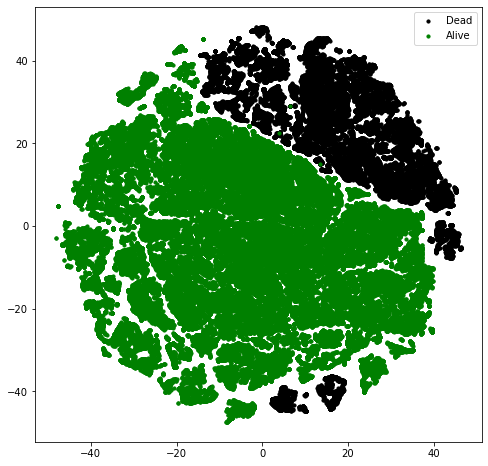

In [163]:
def plot_embedding_alive(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="health", **filter_kwargs)
    color = color[:, 0] != 0.0
    fig, axes = plt.subplots(1, 1, figsize=(8, 8))

    colors = [(0.0, 0.0, 0.0), (0.0, 0.5, 0.0)]
    labels = ["Dead", "Alive"]
    for a, c, l in zip(np.unique(color), colors, labels):
    i = color == a
    sc = axes.scatter(embedding[i, 0], embedding[i, 1], color=c, s=10, label=l)

    axes.legend()

plot_embedding_alive(wrap_file, filtered_pcs_tsne, filter_kwargs)

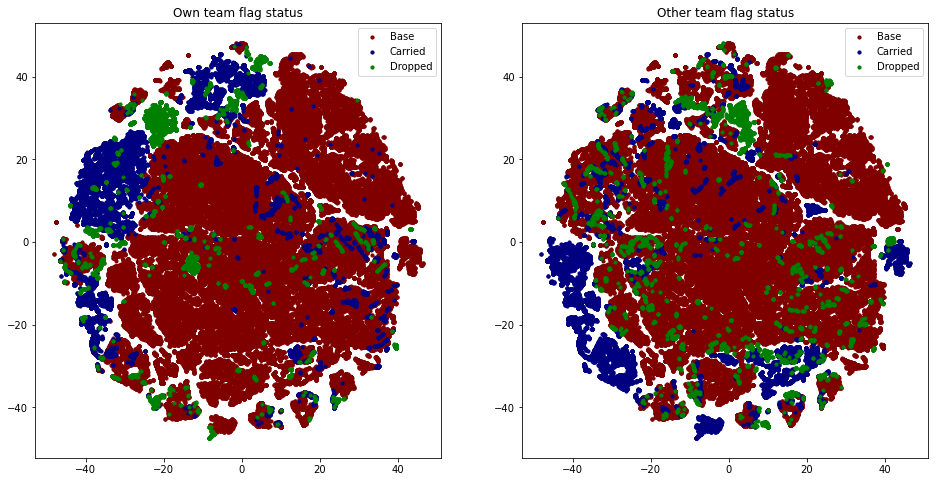

In [173]:
def plot_embedding_own_flag_status(wrap_file, embedding, filter_kwargs):
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    colors = [(0.5, 0.0, 0.0), (0.0, 0.0, 0.5), (0.0, 0.5, 0.0)]
    labels = ["Base", "Carried", "Dropped"]

    color = filter_dataset(wrap_file, value_name="own_flag_status", **filter_kwargs)
    for a, c, l in zip(np.unique(color), colors, labels):
    i = color[:, 0] == a
    sc = axes[0].scatter(embedding[i, 0], embedding[i, 1], color=c, s=10, label=l)

    axes[0].set_title("Own team flag status")  
    axes[0].legend()

    color = filter_dataset(wrap_file, value_name="opponent_flag_status", **filter_kwargs)
    for a, c, l in zip(np.unique(color), colors, labels):
    i = color[:, 0] == a
    sc = axes[1].scatter(embedding[i, 0], embedding[i, 1], color=c, s=10, label=l)

    axes[1].set_title("Other team flag status")  
    axes[1].legend()

plot_embedding_own_flag_status(wrap_file, filtered_pcs_tsne, filter_kwargs)

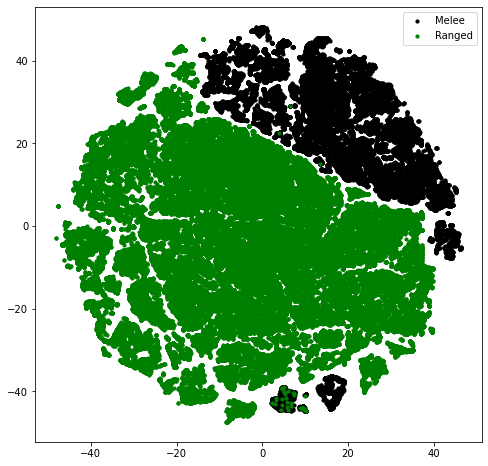

In [174]:
def plot_embedding_ranged(wrap_file, embedding, filter_kwargs):
    color = filter_dataset(wrap_file, value_name="ranged", **filter_kwargs)
    color = color[:, 0] != 0.0
    fig, axes = plt.subplots(1, 1, figsize=(8, 8))

    colors = [(0.0, 0.0, 0.0), (0.0, 0.5, 0.0)]
    labels = ["Melee", "Ranged"]
    for a, c, l in zip(np.unique(color), colors, labels):
    i = color == a
    sc = axes.scatter(embedding[i, 0], embedding[i, 1], color=c, s=10, label=l)

    axes.legend()

plot_embedding_ranged(wrap_file, filtered_pcs_tsne, filter_kwargs)

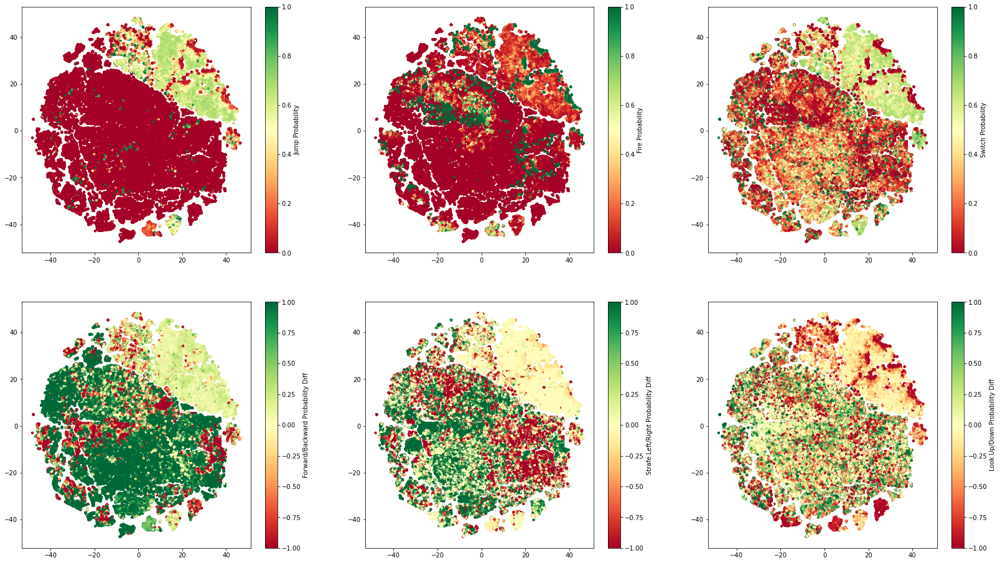

In [164]:
def plot_embedding_policy(wrap_file, embedding, filter_kwargs):
    policy_j = filter_dataset(wrap_file, value_name="policy_j", **filter_kwargs)
    policy_fos = filter_dataset(wrap_file, value_name="policy_fos", **filter_kwargs)
    policy_mfb = filter_dataset(wrap_file, value_name="policy_mbf", **filter_kwargs)
    policy_slr = filter_dataset(wrap_file, value_name="policy_slr", **filter_kwargs)
    policy_lud = filter_dataset(wrap_file, value_name="policy_lud", **filter_kwargs)

    fig, axes = plt.subplots(2, 3, figsize=(28, 16))

    jump_prob = scipy.special.softmax(policy_j, axis=1)[:, 1]
    fire_prob = scipy.special.softmax(policy_fos, axis=1)[:, 1]
    switch_prob = np.sum(scipy.special.softmax(policy_fos, axis=1)[:, 2:], axis=1)
    mfb_prob = scipy.special.softmax(policy_mfb, axis=1)
    mfb_prob = mfb_prob[:,0] - mfb_prob[:, 2]
    slr_prob = scipy.special.softmax(policy_slr, axis=1)
    slr_prob = slr_prob[:,0] - slr_prob[:, 2]
    lud_prob = scipy.special.softmax(policy_lud, axis=1)
    lud_prob = lud_prob[:,0] - lud_prob[:, 2]

    cmap = plt.cm.get_cmap("RdYlGn")

    sc = axes[0, 0].scatter(embedding[:, 0], embedding[:, 1], c=jump_prob, cmap=cmap, s=10, vmin=0, vmax=1)
    cb = fig.colorbar(sc, ax=axes[0, 0])
    cb.set_label("Jump Probability")

    sc = axes[0, 1].scatter(embedding[:, 0], embedding[:, 1], c=fire_prob, cmap=cmap, s=10, vmin=0, vmax=1)
    cb = fig.colorbar(sc, ax=axes[0, 1])
    cb.set_label("Fire Probability")

    sc = axes[0, 2].scatter(embedding[:, 0], embedding[:, 1], c=switch_prob, cmap=cmap, s=10, vmin=0, vmax=1)
    cb = fig.colorbar(sc, ax=axes[0, 2])
    cb.set_label("Switch Probability")

    sc = axes[1, 0].scatter(embedding[:, 0], embedding[:, 1], c=mfb_prob, cmap=cmap, s=10, vmin=-1, vmax=1)
    cb = fig.colorbar(sc, ax=axes[1, 0])
    cb.set_label("Forward/Backward Probability Diff")

    sc = axes[1, 1].scatter(embedding[:, 0], embedding[:, 1], c=slr_prob, cmap=cmap, s=10, vmin=-1, vmax=1)
    cb = fig.colorbar(sc, ax=axes[1, 1])
    cb.set_label("Strafe Left/Right Probability Diff")

    sc = axes[1, 2].scatter(embedding[:, 0], embedding[:, 1], c=lud_prob, cmap=cmap, s=10, vmin=-1, vmax=1)
    cb = fig.colorbar(sc, ax=axes[1, 2])
    cb.set_label("Look Up/Down Probability Diff")

  # Roll is always zero.

plot_embedding_policy(wrap_file, filtered_pcs_tsne, filter_kwargs)